<a href="https://colab.research.google.com/github/Ziad-o-Yusef/Wind-Turbines-Analysis-and-Analytics-of-Power-Generation-by-using-Long-Short-Term-Memory/blob/main/Wind_Turbine_Power_(kW)_Generation_Modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Get & Cleaning Data

In [ ]:
int i = 2, j = 3;
int *p = &i, *q = &j;
*p *= *q;
cout << i << " " << j << endl;


inner: 2
outer: 1


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import os 
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt
from datetime import datetime

Mounted at /content/drive


In [ ]:
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/Kaggle_MyAPI"
! kaggle datasets download psycon/wind-turbine-energy-kw-generation-data
! unzip wind-turbine-energy-kw-generation-data.zip

 99% 50.0M/50.5M [00:02<00:00, 35.6MB/s]
100% 50.5M/50.5M [00:02<00:00, 22.6MB/s]
Archive:  wind-turbine-energy-kw-generation-data.zip
  inflating: feature_units.csv       
  inflating: features.csv            
  inflating: power.csv               
  inflating: sample_submission.csv   


In [ ]:
features_df = pd.read_csv('features.csv')

In [ ]:
for i in range(1,len(features_df.columns)) : 
      features_df[features_df.columns[i]].fillna(method='ffill',inplace = True )
features_df.isna().sum()  

Timestamp                                          0
Gearbox_T1_High_Speed_Shaft_Temperature            0
Gearbox_T3_High_Speed_Shaft_Temperature            0
Gearbox_T1_Intermediate_Speed_Shaft_Temperature    0
Temperature Gearbox Bearing Hollow Shaft           0
                                                  ..
Moment Q Direction                                 0
Moment Q Filltered                                 0
Proxy Sensor_Degree-45                             0
Turbine State                                      0
Proxy Sensor_Degree-315                            0
Length: 77, dtype: int64

In [ ]:
def handling_outliers(orignal_df,lst_of_columns) :
    for i in lst_of_columns:
        q1 = orignal_df[i].quantile(0.25)
        q3 = orignal_df[i].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 -(1.5 * iqr) 
        upper_bound = q3 +(1.5 * iqr)
        for col in range(0,orignal_df.shape[0]):
            if orignal_df[i][col] < lower_bound :
                orignal_df[i][col]  = lower_bound
            elif orignal_df[i][col] > upper_bound :
                orignal_df[i][col]  = upper_bound
            else:
                continue 
    print("handling is done")

In [ ]:
handling_outliers(features_df,features_df.columns[1:])

<ipython-input-6-0cb52c677acc>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  orignal_df[i][col]  = upper_bound
<ipython-input-6-0cb52c677acc>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  orignal_df[i][col]  = lower_bound


handling is done


# Try with one month 
### Train : jan 2019,2020 , Test : jan 2021

In [ ]:
features_df['Timestamp'] =  pd.to_datetime(features_df['Timestamp'])
features_df.reset_index(drop = True,inplace = True)
features_df.set_index('Timestamp',inplace = True)

In [ ]:
# one month 31 day == 6*24*31
# January 2019 from 0 to 6*24*31 - 1
# January 2019 end endix is 4443
# January 2020 start from 52123  and end to 56586
# January 2021 start from 104434  and end to 108750

In [ ]:
features_df.iloc[108750:108751][:]

,Gearbox_T1_High_Speed_Shaft_Temperature,Gearbox_T3_High_Speed_Shaft_Temperature,Gearbox_T1_Intermediate_Speed_Shaft_Temperature,Temperature Gearbox Bearing Hollow Shaft,Tower Acceleration Normal,Gearbox_Oil-2_Temperature,Tower Acceleration Lateral,Temperature Bearing_A,Temperature Trafo-3,Gearbox_T3_Intermediate_Speed_Shaft_Temperature,...,Blade-1 Actual Value_Angle-A,Blade-2 Set Value_Degree,Pitch Demand Baseline_Degree,Blade-1 Set Value_Degree,Blade-3 Set Value_Degree,Moment Q Direction,Moment Q Filltered,Proxy Sensor_Degree-45,Turbine State,Proxy Sensor_Degree-315
Timestamp,,,,,,,,,,,,,,,,,,,,,
2021-02-01,66.84333,68.0,61.174999,64.183334,39.735611,66.0,32.389832,44.0,66.044998,64.183334,...,0.600027,1.214809,0.539778,0.602707,-0.197706,-41.79071,-43.558144,5.636058,1.0,5.645162


In [ ]:
power_df = pd.read_csv("power.csv")
power_df.head()

,Timestamp,Power(kW)
0,2019-01-01 00:00:00,705.876648
1,2019-01-01 00:10:00,884.711670
2,2019-01-01 00:20:00,982.875000
3,2019-01-01 00:30:00,1115.943359
4,2019-01-01 00:40:00,1263.841675


In [ ]:
train_X = features_df.iloc[:4443][:]
train_X = train_X.append(features_df.iloc[52123:56586][:])
train_X = train_X.values
train_Y = power_df.iloc[:4443][:]
train_Y = train_Y.append(power_df.iloc[52123:56586][:])
train_Y = train_Y['Power(kW)']

In [ ]:
test_X = features_df.iloc[104434:108750][:]
test_X = test_X.values
test_Y = power_df.iloc[104434:108750][:]
test_Y = test_Y['Power(kW)']


In [ ]:
(train_X.shape,train_Y.shape),(test_X.shape,test_Y.shape)

(((8906, 76), (8906,)), ((4316, 76), (4316,)))

In [ ]:
from sklearn.preprocessing import StandardScaler
stsc = StandardScaler()
#test_X  = stsc.fit_transform(test_X)
#train_X = stsc.fit_transform(train_X)

In [ ]:
train_X_resh = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X_resh = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
# We reshaped the input into the 3D format as expected by LSTMs, namely [samples, timesteps, features].

In [ ]:
(train_X_resh.shape,train_Y.shape),(test_X_resh.shape,test_Y.shape)

(((8906, 1, 76), (8906,)), ((4316, 1, 76), (4316,)))

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation,Dropout,LSTM,InputLayer
from tensorflow.keras.callbacks import EarlyStopping,TensorBoard

In [ ]:
# TensorBoard actvation 
from datetime import datetime
def tensorboard_dir():
  timenow = datetime.now().strftime("%Y-%m-%d--%H%M")
  log_directory = "logs/fit/"
  log_directory = log_directory + timenow
  board = TensorBoard(log_dir=log_directory,histogram_freq=1)
  return board,log_directory

# LSTM Models 

## Model LSTM_1

In [ ]:
lstm_1 = Sequential()
lstm_1.add(LSTM(512, input_shape=(train_X_resh.shape[1], train_X_resh.shape[2]), return_sequences=True))
lstm_1.add(Dropout(0.1))
lstm_1.add(LSTM(256, return_sequences=True))
lstm_1.add(Dropout(0.3))
lstm_1.add(LSTM(128, return_sequences=True))
lstm_1.add(Dropout(0.5))
lstm_1.add(LSTM(64))
lstm_1.add(Dense(64))
lstm_1.add(Dropout(0.5))
lstm_1.add(Dense(32))
lstm_1.add(Dropout(0.5))
lstm_1.add(Dense(1, activation='relu'))
lstm_1.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae'])

In [ ]:
lstm_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 1, 512)            1206272   
                                                                 
 dropout_3 (Dropout)         (None, 1, 512)            0         
                                                                 
 lstm_5 (LSTM)               (None, 1, 256)            787456    
                                                                 
 dropout_4 (Dropout)         (None, 1, 256)            0         
                                                                 
 lstm_6 (LSTM)               (None, 1, 128)            197120    
                                                                 
 dropout_5 (Dropout)         (None, 1, 128)            0         
                                                                 
 lstm_7 (LSTM)               (None, 64)               

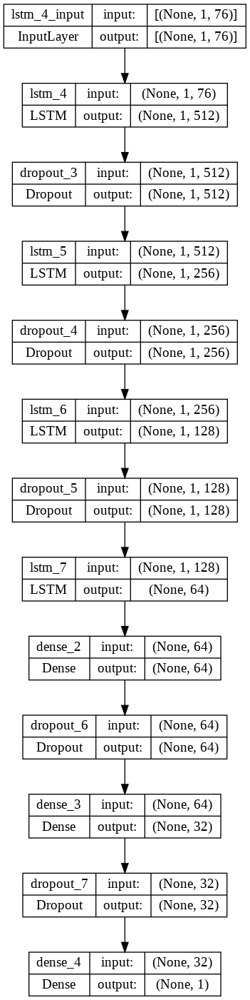

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(lstm_1,show_shapes=True, show_layer_names=True)

In [ ]:
history = lstm_1.fit(train_X_resh, train_Y, epochs=100, validation_data=(test_X_resh, test_Y),verbose=2,)


Epoch 1/100
279/279 - 15s - loss: 1135620.7500 - mae: 693.1972 - val_loss: 61521.8789 - val_mae: 190.4361 - 15s/epoch - 54ms/step
Epoch 2/100
279/279 - 2s - loss: 155902.8594 - mae: 259.9368 - val_loss: 41329.9570 - val_mae: 131.6090 - 2s/epoch - 9ms/step
Epoch 3/100
279/279 - 3s - loss: 148409.7500 - mae: 250.3449 - val_loss: 56845.3164 - val_mae: 152.6466 - 3s/epoch - 10ms/step
Epoch 4/100
279/279 - 2s - loss: 141187.1094 - mae: 245.8482 - val_loss: 51824.4570 - val_mae: 144.2255 - 2s/epoch - 9ms/step
Epoch 5/100
279/279 - 2s - loss: 138847.0938 - mae: 242.6494 - val_loss: 57477.4844 - val_mae: 149.4572 - 2s/epoch - 9ms/step
Epoch 6/100
279/279 - 3s - loss: 137087.4531 - mae: 239.5382 - val_loss: 57033.6914 - val_mae: 158.1595 - 3s/epoch - 9ms/step
Epoch 7/100
279/279 - 2s - loss: 134870.3438 - mae: 237.9422 - val_loss: 56187.4375 - val_mae: 146.3211 - 2s/epoch - 9ms/step
Epoch 8/100
279/279 - 3s - loss: 133702.9062 - mae: 238.2258 - val_loss: 49360.4141 - val_mae: 129.5688 - 3s/epoc

In [ ]:
losse = pd.DataFrame(lstm_1.history.history)

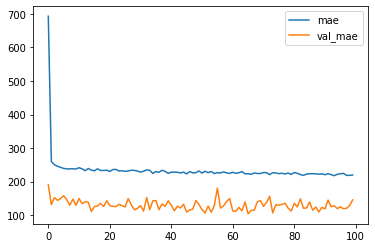

In [ ]:
losse[['mae','val_mae']].plot()

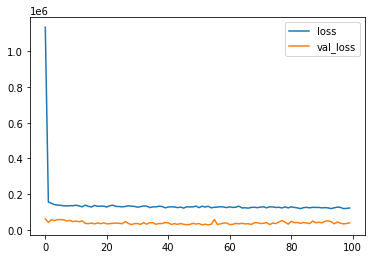

In [ ]:
losse[['loss','val_loss']].plot()

## LSTM_2

In [ ]:
lstm_2 = Sequential()
lstm_2.add(LSTM(1024, input_shape=(train_X_resh.shape[1], train_X_resh.shape[2]), return_sequences=True))
lstm_2.add(Dropout(0.5))
lstm_2.add(LSTM(512, return_sequences=True))
lstm_2.add(Dropout(0.4))
lstm_2.add(LSTM(256, return_sequences=True))
lstm_2.add(Dropout(0.3))
lstm_2.add(LSTM(128, return_sequences=True))
lstm_2.add(Dropout(0.3))
lstm_2.add(LSTM(64))
lstm_2.add(Dense(64))
lstm_2.add(Dropout(0.2))
lstm_2.add(Dense(32))
lstm_2.add(Dropout(0.2))
lstm_2.add(Dense(16))
lstm_2.add(Dropout(0.1))
lstm_2.add(Dense(1, activation='relu'))
lstm_2.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae'])

In [ ]:
lstm_2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_13 (LSTM)              (None, 1, 1024)           4509696   
                                                                 
 dropout_12 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_14 (LSTM)              (None, 1, 512)            3147776   
                                                                 
 dropout_13 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_15 (LSTM)              (None, 1, 256)            787456    
                                                                 
 dropout_14 (Dropout)        (None, 1, 256)            0         
                                                                 
 lstm_16 (LSTM)              (None, 1, 128)           

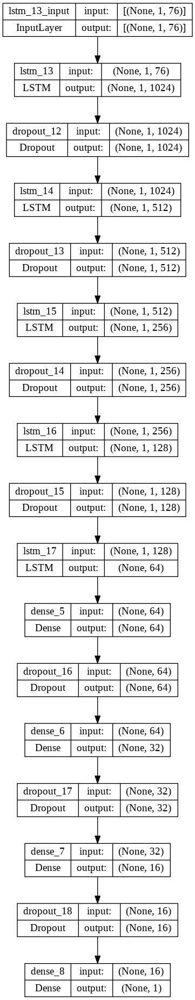

In [ ]:
plot_model(lstm_2,show_shapes=True, show_layer_names=True)

In [ ]:
history = lstm_2.fit(train_X_resh, train_Y, epochs=100, validation_data=(test_X_resh, test_Y), 
                    verbose=2,)

Epoch 1/100
279/279 - 12s - loss: 803440.7500 - mae: 557.1083 - val_loss: 44637.3359 - val_mae: 141.1982 - 12s/epoch - 44ms/step
Epoch 2/100
279/279 - 3s - loss: 83766.8203 - mae: 194.9752 - val_loss: 37879.3086 - val_mae: 122.8110 - 3s/epoch - 12ms/step
Epoch 3/100
279/279 - 3s - loss: 71898.6641 - mae: 180.4120 - val_loss: 48708.3477 - val_mae: 123.6899 - 3s/epoch - 12ms/step
Epoch 4/100
279/279 - 3s - loss: 69219.5625 - mae: 176.9779 - val_loss: 45047.9023 - val_mae: 143.0173 - 3s/epoch - 12ms/step
Epoch 5/100
279/279 - 3s - loss: 69654.1875 - mae: 176.4442 - val_loss: 174398.9531 - val_mae: 180.8669 - 3s/epoch - 12ms/step
Epoch 6/100
279/279 - 3s - loss: 66020.0938 - mae: 173.1072 - val_loss: 66799.3516 - val_mae: 135.0515 - 3s/epoch - 12ms/step
Epoch 7/100
279/279 - 3s - loss: 65659.7109 - mae: 170.8712 - val_loss: 44553.4883 - val_mae: 105.2524 - 3s/epoch - 12ms/step
Epoch 8/100
279/279 - 3s - loss: 62932.8320 - mae: 167.5228 - val_loss: 55233.8398 - val_mae: 130.6290 - 3s/epoch 

In [ ]:
losse = pd.DataFrame(lstm_2.history.history)

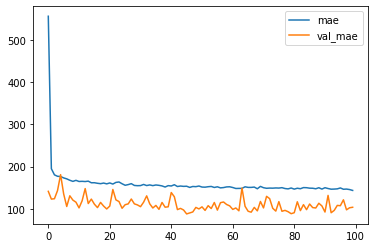

In [ ]:
losse[['mae','val_mae']].plot()

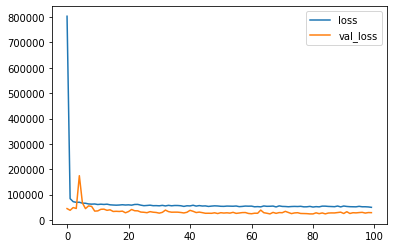

In [ ]:
losse[['loss','val_loss']].plot()
# If we increase the number of epochs in this model, we can get a fairly good result

# GRU RNN Model

In [ ]:
gru_1 = Sequential()
gru_1.add(tf.keras.layers.GRU(512 , input_shape=(train_X.shape[1],1),return_sequences=True))
gru_1.add(tf.keras.layers.BatchNormalization())
gru_1.add(Dropout(0.3))
gru_1.add(tf.keras.layers.GRU(256,return_sequences=True,activation='relu'))
gru_1.add(tf.keras.layers.BatchNormalization())
gru_1.add(Dropout(0.2))
gru_1.add(tf.keras.layers.GRU(128,return_sequences=True,activation='relu'))
gru_1.add(tf.keras.layers.BatchNormalization())
gru_1.add(Dropout(0.2))
gru_1.add(tf.keras.layers.GRU(64,return_sequences=True,activation='relu'))
gru_1.add(tf.keras.layers.BatchNormalization())
gru_1.add(Dropout(0.2))
gru_1.add(Dense(64))
gru_1.add(Dropout(0.2))
gru_1.add(Dense(32))
gru_1.add(Dropout(0.2))
gru_1.add(Dense(16))
gru_1.add(Dropout(0.1))
gru_1.add(Dense(1, activation='relu'))
gru_1.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae'])

In [ ]:
gru_1.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_15 (GRU)                (None, 76, 512)           791040    
                                                                 
 batch_normalization_10 (Bat  (None, 76, 512)          2048      
 chNormalization)                                                
                                                                 
 dropout_32 (Dropout)        (None, 76, 512)           0         
                                                                 
 gru_16 (GRU)                (None, 76, 256)           591360    
                                                                 
 batch_normalization_11 (Bat  (None, 76, 256)          1024      
 chNormalization)                                                
                                                                 
 dropout_33 (Dropout)        (None, 76, 256)         

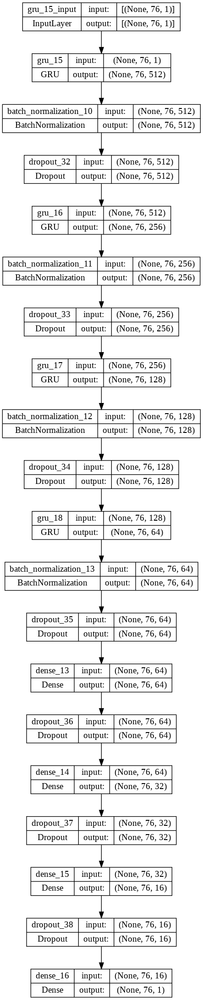

In [ ]:
plot_model(gru_1,show_shapes=True, show_layer_names=True)

In [ ]:
history = gru_1.fit(train_X, train_Y, epochs=100, validation_data=(test_X, test_Y), 
                    verbose=2,)

Epoch 1/100
279/279 - 150s - loss: 756126.6250 - mae: 568.7038 - val_loss: 272756.3438 - val_mae: 389.0834 - 150s/epoch - 537ms/step
Epoch 2/100
279/279 - 144s - loss: 221465.4688 - mae: 335.8755 - val_loss: 181783.4531 - val_mae: 309.7302 - 144s/epoch - 515ms/step
Epoch 3/100
279/279 - 142s - loss: 201234.8750 - mae: 320.1997 - val_loss: 192495.7500 - val_mae: 316.8063 - 142s/epoch - 509ms/step
Epoch 4/100
279/279 - 142s - loss: 201815.0469 - mae: 320.5431 - val_loss: 149123.0625 - val_mae: 281.4778 - 142s/epoch - 508ms/step
Epoch 5/100
279/279 - 141s - loss: 187441.0781 - mae: 309.0324 - val_loss: 230340.7344 - val_mae: 345.9836 - 141s/epoch - 507ms/step
Epoch 6/100
279/279 - 141s - loss: 187047.8125 - mae: 307.7548 - val_loss: 170946.8438 - val_mae: 272.3339 - 141s/epoch - 507ms/step
Epoch 7/100
279/279 - 142s - loss: 163535.1719 - mae: 289.0278 - val_loss: 142686.8438 - val_mae: 257.6273 - 142s/epoch - 510ms/step
Epoch 8/100
279/279 - 141s - loss: 162788.8125 - mae: 286.8386 - val_

KeyboardInterrupt: ignored

In [ ]:
lstm_2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_13 (LSTM)              (None, 1, 1024)           4509696   
                                                                 
 dropout_12 (Dropout)        (None, 1, 1024)           0         
                                                                 
 lstm_14 (LSTM)              (None, 1, 512)            3147776   
                                                                 
 dropout_13 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_15 (LSTM)              (None, 1, 256)            787456    
                                                                 
 dropout_14 (Dropout)        (None, 1, 256)            0         
                                                                 
 lstm_16 (LSTM)              (None, 1, 128)           

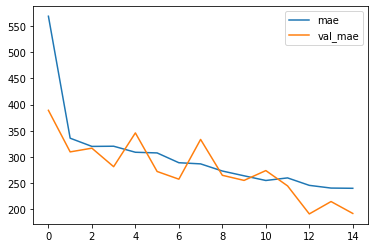

In [ ]:
losse = pd.DataFrame(gru_1.history.history)
losse[['mae','val_mae']].plot()

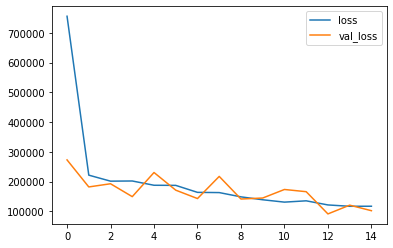

In [ ]:
losse[['loss','val_loss']].plot()
# that is just for 15 epoch and I stoped it becouse the time 

# work with more than one month 
### train on 4 months and predict 4 month

In [ ]:
features_df.iloc[17093][0]

'2019-04-30 23:50:00'

In [ ]:
features_df.iloc[52123+17364][0]

'2020-04-30 23:50:00'

In [ ]:
features_df['Timestamp'] =  pd.to_datetime(features_df['Timestamp'])
features_df.reset_index(drop = True,inplace = True)
features_df.set_index('Timestamp',inplace = True)

In [ ]:
train_X = features_df.iloc[:17093][:]
train_X = train_X.append(features_df.iloc[52123:52123+17364][:])
train_X = train_X.values
train_Y = power_df.iloc[:17093][:]
train_Y = train_Y.append(power_df.iloc[52123:52123+17364][:])
train_Y = train_Y['Power(kW)']

In [ ]:
test_X = features_df.iloc[104434:104434+17093][:]
test_X = test_X.values
test_Y = power_df.iloc[104434:104434+17093][:]
test_Y = test_Y['Power(kW)']

In [ ]:
(train_X.shape,train_Y.shape),(test_X.shape,test_Y.shape)

(((34457, 76), (34457,)), ((17093, 76), (17093,)))

In [ ]:
stsc = StandardScaler()
test_X  = stsc.fit_transform(test_X)
train_X = stsc.fit_transform(train_X)

In [ ]:
train_X_resh = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X_resh = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

In [ ]:
(train_X_resh.shape,train_Y.shape),(test_X_resh.shape,test_Y.shape)

(((34457, 1, 76), (34457,)), ((17093, 1, 76), (17093,)))

## Use LSTM_2 model which we build it before 

In [ ]:
lstm_2 = Sequential()
lstm_2.add(LSTM(1024, input_shape=(train_X_resh.shape[1], train_X_resh.shape[2]), return_sequences=True,activation='tanh',kernel_initializer='he_uniform'))
lstm_2.add(Dropout(0.5))
lstm_2.add(LSTM(512, return_sequences=True,activation='tanh',kernel_initializer='he_uniform'))
lstm_2.add(Dropout(0.4))
lstm_2.add(LSTM(256, return_sequences=True,activation='tanh',kernel_initializer='he_uniform'))
lstm_2.add(Dropout(0.3))
lstm_2.add(LSTM(128, return_sequences=True,activation='tanh',kernel_initializer='he_uniform'))
lstm_2.add(Dropout(0.3))
lstm_2.add(LSTM(64))
lstm_2.add(Dense(64,activation='relu'))
lstm_2.add(Dropout(0.2))
lstm_2.add(Dense(32,activation='relu'))
lstm_2.add(Dropout(0.2))
lstm_2.add(Dense(16,activation='relu'))
lstm_2.add(Dropout(0.1))
lstm_2.add(Dense(1, activation='relu'))
lstm_2.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae'])

In [ ]:
history = lstm_2.fit(train_X_resh, train_Y, epochs=500, validation_data=(test_X_resh, test_Y), verbose=2,)

Epoch 1/500
1077/1077 - 20s - loss: 383971.8125 - mae: 339.7772 - val_loss: 25500.6328 - val_mae: 91.8981 - 20s/epoch - 19ms/step
Epoch 2/500
1077/1077 - 12s - loss: 93395.3594 - mae: 201.2089 - val_loss: 20806.0723 - val_mae: 84.2778 - 12s/epoch - 11ms/step
Epoch 3/500
1077/1077 - 12s - loss: 90027.5234 - mae: 196.3684 - val_loss: 18518.5234 - val_mae: 87.5896 - 12s/epoch - 11ms/step
Epoch 4/500
1077/1077 - 12s - loss: 90160.0625 - mae: 195.5324 - val_loss: 22606.0898 - val_mae: 107.7109 - 12s/epoch - 11ms/step
Epoch 5/500
1077/1077 - 13s - loss: 88720.4141 - mae: 193.2761 - val_loss: 15360.8076 - val_mae: 80.0893 - 13s/epoch - 12ms/step
Epoch 6/500
1077/1077 - 12s - loss: 85653.2500 - mae: 189.5439 - val_loss: 15793.3115 - val_mae: 79.0592 - 12s/epoch - 11ms/step
Epoch 7/500
1077/1077 - 12s - loss: 85457.1875 - mae: 188.8875 - val_loss: 19033.1680 - val_mae: 100.5204 - 12s/epoch - 11ms/step
Epoch 8/500
1077/1077 - 12s - loss: 83785.0938 - mae: 187.3508 - val_loss: 18117.6895 - val_ma

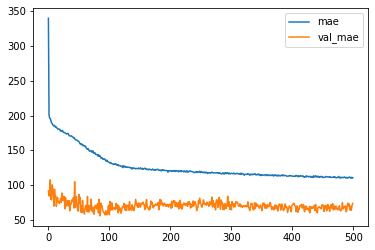

In [ ]:
losse[['mae','val_mae']].plot()

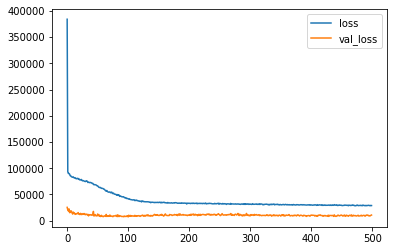

In [ ]:
losse[['loss','val_loss']].plot()
# If we increase the number of epochs in this model, we can get a fairly good result

In [ ]:
import plotly.offline as py
import plotly.graph_objs as go
yhat = lstm_2.predict(test_X_resh)
testY_reshape = test_Y
yhat_reshape = yhat.reshape(len(yhat))
predictDates = features_df.iloc[104434:104434+17093][:].index
predict_chart = go.Scatter(x=predictDates, y=yhat_reshape, name= 'Predict Power')
actual_chart = go.Scatter(x=predictDates, y=testY_reshape, name= 'Actual Power')
py.iplot([predict_chart, actual_chart])

535/535 [==============================] - 4s 4ms/step


## Notes:
### 1- I think this model is very good! I see it as almost perfect, but it lacks an increase in the number of epochs to 500 or 800, for example
### 2- Since the data is seasonal, we cannot work in a direct time series, but we can develop this model and then train it for the years 2019 and 2020 during the second half of the year from June to December,The second half of the year is expected for us in 2021, which is the Target. Perhaps first, we can work on a period of four months and develop a model that can work for the three annual seasons.
### 3- We could also work on GRU but it's actually way more time consuming than CNN itself! But it may give us better results!
##**I hope to hear your opinion on the next step, thank you**

## An attempt to train the model for the first four months of 2020 and 2021, and the expected months of April and June in 2022

In [ ]:
104434+17093

121527

In [ ]:
power_df.iloc[121527+10000][:]

Timestamp    2021-07-09 20:50:00
Power(kW)            2757.083252
Name: 131527, dtype: object

In [ ]:
X_val = features_df.iloc[121527:121527+10000][:]
Y_val = power_df.iloc[121527:121527+10000][:]
Y_val = Y_val['Power(kW)']
X_val  = stsc.fit_transform(X_val)
X_val_resh = X_val.reshape((X_val.shape[0], 1, X_val.shape[1]))
(X_val_resh.shape,Y_val.shape)

((10000, 1, 76), (10000,))

In [ ]:
yhat = lstm_2.predict(X_val_resh)
testY_reshape = Y_val
yhat_reshape = yhat.reshape(len(yhat))
predictDates = features_df.iloc[121527:121527+10000][:].index
predict_chart = go.Scatter(x=predictDates, y=yhat_reshape, name= 'Predict Power')
actual_chart = go.Scatter(x=predictDates, y=testY_reshape, name= 'Actual Power')
py.iplot([predict_chart, actual_chart])

313/313 [==============================] - 2s 5ms/step


### Notes:
Because the data is really seasonal, this, as expected, is a bad result, so these months should be included in training,
So, if we train the model over the last six months of 2019 and 2020, and by increasing the number of epochs, we will get very good results.

## Model training for the last six months of 2020 and 2021

I will start train the model from 1/6/2019 to the end of 2019 , and 2020 the same ,,, and test at 6,7,8 months of 2021 and predict the last months of 2021

In [ ]:
power_df.iloc[125800][:]

Timestamp    2021-05-30 11:40:00
Power(kW)                304.125
Name: 125800, dtype: object

In [ ]:
train_X = features_df.iloc[21593:52122][:]
train_X = train_X.append(features_df.iloc[73715:104433][:])
train_X = train_X.values
train_Y = power_df.iloc[21593:52122][:]
train_Y = train_Y.append(power_df.iloc[73715:104433][:])
train_Y = train_Y['Power(kW)']

In [ ]:
test_X = features_df.iloc[125800:136729][:]
test_X = test_X.values
test_Y = power_df.iloc[125800:136729][:]
test_Y = test_Y['Power(kW)']

In [ ]:
(train_X.shape,train_Y.shape),(test_X.shape,test_Y.shape)

(((61247, 76), (61247,)), ((10929, 76), (10929,)))

In [ ]:
from sklearn.preprocessing import StandardScaler
stsc = StandardScaler()
test_X  = stsc.fit_transform(test_X)
train_X = stsc.fit_transform(train_X)

In [ ]:
train_X_resh = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X_resh = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

In [ ]:
(train_X_resh.shape,train_Y.shape),(test_X_resh.shape,test_Y.shape)

(((61247, 1, 76), (61247,)), ((10929, 1, 76), (10929,)))

### Updates 
#### 1- Add activations & kernel_initializer & 2 layers
#### 2- epochs up to 500

In [ ]:
board,log_directory = tensorboard_dir()

In [ ]:
lstm_3 = Sequential()
lstm_3.add(LSTM(2048, input_shape=(train_X_resh.shape[1], train_X_resh.shape[2]), return_sequences=True,activation='tanh',kernel_initializer='he_uniform'))
lstm_3.add(Dropout(0.5))
lstm_3.add(LSTM(1024, return_sequences=True,activation='tanh',kernel_initializer='he_uniform'))
lstm_3.add(Dropout(0.4))
lstm_3.add(LSTM(512, return_sequences=True,activation='tanh',kernel_initializer='he_uniform'))
lstm_3.add(Dropout(0.4))
lstm_3.add(LSTM(256, return_sequences=True,activation='tanh',kernel_initializer='he_uniform'))
lstm_3.add(Dropout(0.3))
lstm_3.add(LSTM(128, return_sequences=True,activation='tanh',kernel_initializer='he_uniform'))
lstm_3.add(Dropout(0.3))
lstm_3.add(LSTM(64))
lstm_3.add(Dense(64,activation='tanh'))
lstm_3.add(Dropout(0.2))
lstm_3.add(Dense(32,activation='relu'))
lstm_3.add(Dropout(0.2))
lstm_3.add(Dense(16,activation='relu'))
lstm_3.add(Dropout(0.1))
lstm_3.add(Dense(1, activation='relu'))
lstm_3.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae'])

In [ ]:
history = lstm_3.fit(train_X_resh, train_Y, epochs=250, validation_data=(test_X_resh, test_Y), verbose=2,callbacks=[board])

Epoch 1/250
1914/1914 - 64s - loss: 432075.7500 - mae: 401.4002 - val_loss: 36328.5703 - val_mae: 137.2829 - 64s/epoch - 33ms/step
Epoch 2/250
1914/1914 - 48s - loss: 172248.7344 - mae: 269.9236 - val_loss: 26596.3008 - val_mae: 114.1736 - 48s/epoch - 25ms/step
Epoch 3/250
1914/1914 - 50s - loss: 152974.6250 - mae: 251.3030 - val_loss: 29860.7285 - val_mae: 126.0378 - 50s/epoch - 26ms/step
Epoch 4/250
1914/1914 - 50s - loss: 134152.2188 - mae: 232.6315 - val_loss: 37526.2656 - val_mae: 136.4755 - 50s/epoch - 26ms/step
Epoch 5/250
1914/1914 - 47s - loss: 122697.2656 - mae: 216.1417 - val_loss: 33531.7500 - val_mae: 126.2800 - 47s/epoch - 25ms/step
Epoch 6/250
1914/1914 - 47s - loss: 114762.0078 - mae: 206.7880 - val_loss: 48514.8125 - val_mae: 151.3545 - 47s/epoch - 25ms/step
Epoch 7/250
1914/1914 - 47s - loss: 110651.4297 - mae: 201.7759 - val_loss: 48821.6250 - val_mae: 149.7268 - 47s/epoch - 25ms/step
Epoch 8/250
1914/1914 - 50s - loss: 112520.6797 - mae: 200.9592 - val_loss: 43151.8

In [ ]:
losse3 = pd.DataFrame(lstm_3.history.history)

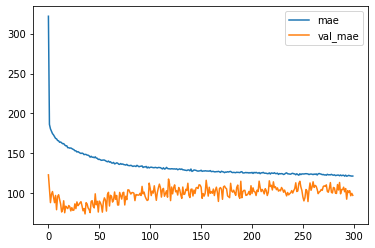

In [ ]:
losse3[['mae','val_mae']].plot()

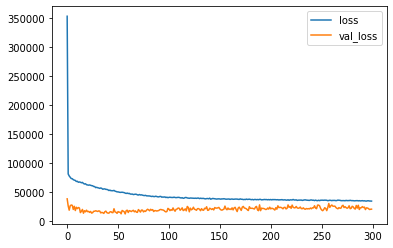

In [ ]:
losse3[['loss','val_loss']].plot()
# If we increase the number of epochs in this model, we can get a fairly good result

In [ ]:
yhat = loaded_model.predict(test_X_resh)
testY_reshape = test_Y
yhat_reshape = yhat.reshape(len(yhat))
predictDates = features_df.iloc[125800:136729][:].index
predict_chart = go.Scatter(x=predictDates, y=yhat_reshape, name= 'Predict Power')
actual_chart = go.Scatter(x=predictDates, y=testY_reshape, name= 'Actual Power')
py.iplot([predict_chart, actual_chart])

342/342 [==============================] - 2s 7ms/step


In [ ]:
test_Y.shape
#yhat_reshape.shape

(10929,)

In [ ]:
test = pd.DataFrame()
test['Timestamp'] = predictDates
test['Actual Power'] = test_Y.values
test['Predict Power'] = yhat_reshape
test.head(10)

,Timestamp,Actual Power,Predict Power
0,2021-05-30 11:40:00,304.125000,288.695129
1,2021-05-30 11:50:00,185.556671,228.155548
2,2021-05-30 12:00:00,246.748337,272.930542
3,2021-05-30 12:10:00,222.550003,240.197830
4,2021-05-30 12:20:00,242.436661,258.664459
5,2021-05-30 12:30:00,306.603333,364.238556
6,2021-05-30 12:40:00,242.451660,264.482117
7,2021-05-30 12:50:00,242.548340,255.951508
8,2021-05-30 13:00:00,245.479996,326.550720
9,2021-05-30 13:10:00,277.746674,357.431580


In [ ]:
test.tail(10)

,Timestamp,Actual Power,Predict Power
10919,2021-08-14 22:10:00,2757.649902,2702.369873
10920,2021-08-14 22:20:00,2757.031738,2703.735107
10921,2021-08-14 22:30:00,2761.171631,2701.244629
10922,2021-08-14 22:40:00,2759.375000,2701.562744
10923,2021-08-14 22:50:00,2756.701660,2701.410645
10924,2021-08-14 23:00:00,2758.583252,2702.638672
10925,2021-08-14 23:10:00,2757.728271,2700.984375
10926,2021-08-14 23:20:00,2758.323242,2700.840088
10927,2021-08-14 23:30:00,2759.243408,2706.025879
10928,2021-08-14 23:40:00,2761.261719,2702.534424


In [ ]:
!unzip /content/drive/MyDrive/modeling_1.1/logs.zip

Archive:  /content/drive/MyDrive/modeling_1.1/logs.zip
  inflating: logs/fit/2022-12-03--1328/validation/events.out.tfevents.1670074186.ecedd3f25101.75.3.v2  
  inflating: logs/fit/2022-12-03--1320/validation/events.out.tfevents.1670073755.ecedd3f25101.75.1.v2  
  inflating: logs/fit/2022-12-03--1320/train/events.out.tfevents.1670073703.ecedd3f25101.75.0.v2  
  inflating: logs/fit/2022-12-03--1328/train/events.out.tfevents.1670074139.ecedd3f25101.75.2.v2  


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping,TensorBoard
%load_ext tensorboard
%tensorboard --logdir /content/logs/fit/2022-12-03--1328

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 310), started 0:12:18 ago. (Use '!kill 310' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/modeling_1.1/logs.zip

Archive:  /content/drive/MyDrive/modeling_1.1/logs.zip
  inflating: logs/fit/2022-12-03--1328/validation/events.out.tfevents.1670074186.ecedd3f25101.75.3.v2  
  inflating: logs/fit/2022-12-03--1320/validation/events.out.tfevents.1670073755.ecedd3f25101.75.1.v2  
  inflating: logs/fit/2022-12-03--1320/train/events.out.tfevents.1670073703.ecedd3f25101.75.0.v2  
  inflating: logs/fit/2022-12-03--1328/train/events.out.tfevents.1670074139.ecedd3f25101.75.2.v2  


In [ ]:
import plotly.graph_objs as go
import plotly.offline as py

X_pred = features_df.iloc[136729:][:]
X_pred = X_pred.values
X_pred  = stsc.fit_transform(X_pred)
X_pred_resh = X_pred.reshape((X_pred.shape[0], 1, X_pred.shape[1]))
y_pred = loaded_model.predict(X_pred_resh)
y_pred_reshape = y_pred.reshape(len(y_pred))
predictDates = features_df.iloc[136729:][:].index
actual_chart = go.Scatter(x=predictDates, y=y_pred_reshape, name= 'Power Prediction')
py.iplot([actual_chart])

548/548 [==============================] - 4s 8ms/step


In [ ]:
model_json = lstm_3.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
lstm_3.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


In [ ]:
from tensorflow.keras.models import model_from_json
json_file = open('/content/drive/MyDrive/modeling_1.1/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("/content/drive/MyDrive/modeling_1.1/model.h5")
print("Loaded model from disk")
 
loaded_model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

Loaded model from disk


In [ ]:
loaded_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 1, 2048)           17408000  
                                                                 
 dropout_8 (Dropout)         (None, 1, 2048)           0         
                                                                 
 lstm_7 (LSTM)               (None, 1, 1024)           12587008  
                                                                 
 dropout_9 (Dropout)         (None, 1, 1024)           0         
                                                                 
 lstm_8 (LSTM)               (None, 1, 512)            3147776   
                                                                 
 dropout_10 (Dropout)        (None, 1, 512)            0         
                                                                 
 lstm_9 (LSTM)               (None, 1, 256)           

In [ ]:
Prediction_df = pd.DataFrame()
Prediction_df['Timestamp'] = predictDates
Prediction_df['Power'] = y_pred_reshape
Prediction_df.head(10)

,Timestamp,Power
0,2021-08-14 23:50:00,2698.812012
1,2021-08-15 00:00:00,2699.580566
2,2021-08-15 00:10:00,2649.548584
3,2021-08-15 00:20:00,2676.654541
4,2021-08-15 00:30:00,2648.677979
5,2021-08-15 00:40:00,2697.736816
6,2021-08-15 00:50:00,2693.302979
7,2021-08-15 01:00:00,2640.330566
8,2021-08-15 01:10:00,2679.454590
9,2021-08-15 01:20:00,2682.654053


In [ ]:
Prediction_df.tail(10)

,Timestamp,Power
17523,2021-12-14 22:20:00,2713.206055
17524,2021-12-14 22:30:00,2712.429199
17525,2021-12-14 22:40:00,2713.183350
17526,2021-12-14 22:50:00,2713.802490
17527,2021-12-14 23:00:00,2713.477295
17528,2021-12-14 23:10:00,2713.484863
17529,2021-12-14 23:20:00,2713.391602
17530,2021-12-14 23:30:00,2712.619629
17531,2021-12-14 23:40:00,2713.990479
17532,2021-12-14 23:50:00,2711.254639


In [ ]:
Prediction_df.to_csv('prediction.csv')  

In [ ]:
Prediction_df[Prediction_df['Power']==0].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4209 entries, 317 to 17472
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Timestamp  4209 non-null   datetime64[ns]
 1   Power      4209 non-null   float32       
dtypes: datetime64[ns](1), float32(1)
memory usage: 82.2 KB


In [ ]:
Prediction_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17533 entries, 0 to 17532
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Timestamp  17533 non-null  datetime64[ns]
 1   Power      17533 non-null  float32       
dtypes: datetime64[ns](1), float32(1)
memory usage: 205.6 KB
